In [2]:
!python --version

Python 3.10.18


In [3]:
import torch
torch.__version__

'2.5.1+cu121'

In [4]:
torch.cuda.get_device_name(0)


'NVIDIA RTX 5000 Ada Generation'

In [5]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import os

class CelebADataset(Dataset):
    def __init__(self, root_dir, transform=None):
        """
        Args:
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        self.root_dir = root_dir
        self.transform = transform
        
        # Get all image file paths from the directory
        self.image_paths = [os.path.join(root_dir, img) for img in os.listdir(root_dir) if img.endswith('.jpg')]

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Load image
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        
        # Apply the transform if provided
        if self.transform:
            image = self.transform(image)
        
        return image

In [24]:
# defining thw ransformations

transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize(mean = [0.5,0.5,0.5],std = [0.5,0.5,0.5])
])

dataset_path = '/data1/adarsh/CELEB_FACE_DATASET/img_align_celeba'
dataset = CelebADataset(root_dir = dataset_path,transform = transform)

dataloader = DataLoader(dataset,batch_size = 128,shuffle = True)

print(f"Total num of imag loaded:{len(dataset)}")

Total num of imag loaded:202599


In [7]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt
import os
from PIL import Image
import torchvision
import numpy as np


In [8]:
class Generator(nn.Module):
    def __init__(self,z_dim = 100,img_channels = 3):
        super(Generator,self).__init__()
        self.model = nn.Sequential(
            nn.Linear(z_dim,256),
            nn.ReLU(True),
            nn.Linear(256,512),
            nn.ReLU(True),
            nn.Linear(512,1024),
            nn.ReLU(True),
            nn.Linear(1024,img_channels * 64 * 64),
            nn.Tanh()
            
        )

    def forward(self,z):
        img  = self.model(z)
        img = img.view(img.size(0),3,64,64)
        return img

In [9]:
class Discriminator(nn.Module):
    def __init__(self,img_channels = 3):
        super(Discriminator,self).__init__()
        self.model = nn.Sequential(
            nn.Flatten(),
            nn.Linear(img_channels * 64 * 64,1024),
            nn.LeakyReLU(0.2,inplace = True),
            nn.Linear(1024,512),
            nn.LeakyReLU(0.2,inplace = True),
            nn.Linear(512,256),
            nn.LeakyReLU(0.2,inplace = True),
            nn.Linear(256,1),
            nn.Sigmoid()
        )

    def forward(self,img):
        return self.model(img)
        

In [10]:
# Loss function and optimiser

adversarial_loss = nn.BCELoss()
generator = Generator(z_dim = 100)
discriminator = Discriminator()

optimizer_G = optim.Adam(generator.parameters(),lr = 0.0002,betas = (0.5,0.999))
optimizer_D = optim.Adam(discriminator.parameters(),lr = 0.0002,betas = (0.5,0.999))


In [11]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
generator = generator.to(device)
discriminator = discriminator.to(device)

In [12]:
def save_generated_images(generator, epoch, device, num_images=16, image_dir="generated_images"):
    os.makedirs(image_dir, exist_ok=True)  # ensure folder exists

    # sample noise
    z = torch.randn(num_images, 100).to(device)
    generated_imgs = generator(z).detach().cpu()

    # save in local directory
    save_path = os.path.join(image_dir, f"epoch_{epoch+1}.png")
    torchvision.utils.save_image(
        generated_imgs, 
        save_path,
        nrow=4, normalize=True
    )
    print(f"Saved generated images at: {save_path}")

    # show inline (optional during training)
    grid = torchvision.utils.make_grid(generated_imgs, nrow=4, normalize=True)
    plt.figure(figsize=(6, 6))   # better scaling
    plt.imshow(np.transpose(grid, (1, 2, 0)))
    plt.title(f"Epoch {epoch+1}")
    plt.axis('off')
    plt.show()


In [13]:
import os
import torch

# Directories
checkpoint_dir = "checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)

def save_checkpoint(generator, discriminator, optimizer_G, optimizer_D, epoch, max_keep=5):
    """Save model checkpoints and keep only the last 'max_keep' files."""
    checkpoint_path = os.path.join(checkpoint_dir, f"checkpoint_epoch_{epoch+1}.pth")
    
    # Save both Generator & Discriminator states
    torch.save({
        'epoch': epoch+1,
        'generator_state_dict': generator.state_dict(),
        'discriminator_state_dict': discriminator.state_dict(),
        'optimizer_G_state_dict': optimizer_G.state_dict(),
        'optimizer_D_state_dict': optimizer_D.state_dict(),
    }, checkpoint_path)

    # Manage only last max_keep checkpoints
    checkpoints = [f for f in os.listdir(checkpoint_dir) if f.endswith(".pth")]
    # Sort numerically by epoch number
    checkpoints = sorted(checkpoints, key=lambda x: int(x.split("_")[-1].split(".")[0]))
    
    # Remove oldest if exceeding max_keep
    while len(checkpoints) > max_keep:
        os.remove(os.path.join(checkpoint_dir, checkpoints[0]))
        checkpoints.pop(0)


In [14]:
# Resume training if checkpoint exists
def load_latest_checkpoint(generator, discriminator, optimizer_G, optimizer_D, checkpoint_dir="checkpoints"):
    if not os.path.exists(checkpoint_dir):
        return 0  # start from epoch 0
    
    checkpoints = [f for f in os.listdir(checkpoint_dir) if f.endswith(".pth")]
    if len(checkpoints) == 0:
        return 0  # no checkpoints found
    
    # Sort numerically by epoch number
    checkpoints = sorted(checkpoints, key=lambda x: int(x.split("_")[-1].split(".")[0]))
    
    latest_checkpoint = checkpoints[-1]  # now this is truly the latest epoch
    checkpoint_path = os.path.join(checkpoint_dir, latest_checkpoint)
    print(f"Loading checkpoint: {checkpoint_path}")
    
    checkpoint = torch.load(checkpoint_path, map_location=device)
    generator.load_state_dict(checkpoint['generator_state_dict'])
    discriminator.load_state_dict(checkpoint['discriminator_state_dict'])
    optimizer_G.load_state_dict(checkpoint['optimizer_G_state_dict'])
    optimizer_D.load_state_dict(checkpoint['optimizer_D_state_dict'])
    
    return checkpoint['epoch']  # return the last trained epoch



In [15]:
def train(generator,discriminator,dataloader,epochs = 10):
    start_epoch = load_latest_checkpoint(generator, discriminator, optimizer_G, optimizer_D)
    for epoch in range(start_epoch,epochs):
        for i , imgs in enumerate(dataloader):
            real_imgs = imgs.to(device)
            batch_size = real_imgs.size(0)
            valid = torch.ones(batch_size,1).to(device)
            fake = torch.zeros(batch_size,1).to(device)

            # train discriminator
            optimizer_D.zero_grad()
            real_loss = adversarial_loss(discriminator(real_imgs),valid)
            fake_loss = adversarial_loss(discriminator(generator(torch.randn(batch_size,100).to(device)).detach()),fake)
            d_loss = (real_loss + fake_loss)/2
            d_loss.backward()
            optimizer_D.step()

            # Training the generator 
            optimizer_G.zero_grad()
            g_loss = adversarial_loss(discriminator(generator(torch.randn(batch_size,100).to(device))),valid)
            g_loss.backward()
            optimizer_G.step()

            if i%100 ==0:
                print(f"[Epochs {epoch+1}/{epochs}] [Batch {i}/{len(dataloader)}] [D_loss : {d_loss.item()}] [G_loss : {g_loss.item()}]")

        save_generated_images(generator, epoch, device)
        # At the end of epoch
        save_checkpoint(generator, discriminator,optimizer_G,optimizer_D, epoch, max_keep=3)



    

Loading checkpoint: checkpoints/checkpoint_epoch_74.pth


/tmp/ipykernel_118937/2431812173.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=device)


[Epochs 75/100] [Batch 0/1583] [D_loss : 0.3226178288459778] [G_loss : 2.1644625663757324]
[Epochs 75/100] [Batch 100/1583] [D_loss : 0.3542330861091614] [G_loss : 2.073184013366699]
[Epochs 75/100] [Batch 200/1583] [D_loss : 0.30269503593444824] [G_loss : 2.6436638832092285]
[Epochs 75/100] [Batch 300/1583] [D_loss : 0.41452598571777344] [G_loss : 1.4720087051391602]
[Epochs 75/100] [Batch 400/1583] [D_loss : 0.33404964208602905] [G_loss : 2.6350653171539307]
[Epochs 75/100] [Batch 500/1583] [D_loss : 0.3611116111278534] [G_loss : 2.178729295730591]
[Epochs 75/100] [Batch 600/1583] [D_loss : 0.3800160884857178] [G_loss : 1.7585200071334839]
[Epochs 75/100] [Batch 700/1583] [D_loss : 0.3248113691806793] [G_loss : 1.9679672718048096]
[Epochs 75/100] [Batch 800/1583] [D_loss : 0.3291570842266083] [G_loss : 1.9211106300354004]
[Epochs 75/100] [Batch 900/1583] [D_loss : 0.3599385619163513] [G_loss : 2.306377410888672]
[Epochs 75/100] [Batch 1000/1583] [D_loss : 0.25437304377555847] [G_loss

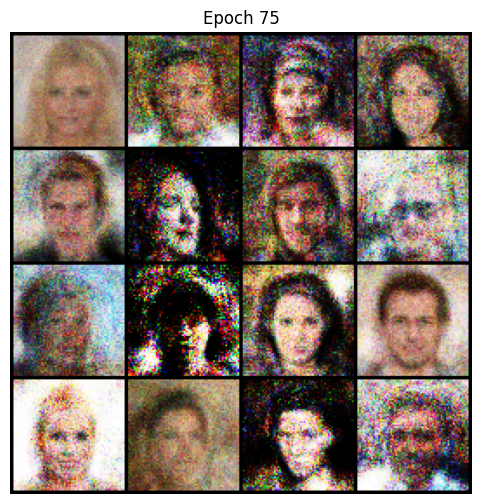

[Epochs 76/100] [Batch 0/1583] [D_loss : 0.24917848408222198] [G_loss : 2.8932957649230957]
[Epochs 76/100] [Batch 100/1583] [D_loss : 0.2714357376098633] [G_loss : 2.865478515625]
[Epochs 76/100] [Batch 200/1583] [D_loss : 0.4017733633518219] [G_loss : 1.704491138458252]
[Epochs 76/100] [Batch 300/1583] [D_loss : 0.2983695864677429] [G_loss : 1.9933022260665894]
[Epochs 76/100] [Batch 400/1583] [D_loss : 0.30583491921424866] [G_loss : 2.092121124267578]
[Epochs 76/100] [Batch 500/1583] [D_loss : 0.3604721426963806] [G_loss : 1.5110816955566406]
[Epochs 76/100] [Batch 600/1583] [D_loss : 0.2669637203216553] [G_loss : 2.8082809448242188]
[Epochs 76/100] [Batch 700/1583] [D_loss : 0.21460269391536713] [G_loss : 2.670964002609253]
[Epochs 76/100] [Batch 800/1583] [D_loss : 0.30648109316825867] [G_loss : 2.622532844543457]
[Epochs 76/100] [Batch 900/1583] [D_loss : 0.26021698117256165] [G_loss : 2.4524495601654053]
[Epochs 76/100] [Batch 1000/1583] [D_loss : 0.2853408455848694] [G_loss : 2

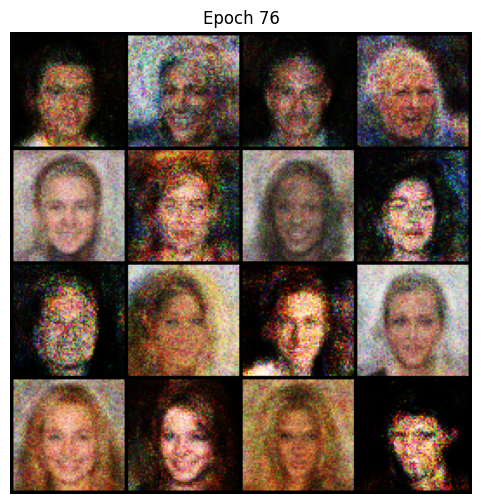

[Epochs 77/100] [Batch 0/1583] [D_loss : 0.2787700295448303] [G_loss : 2.8790040016174316]
[Epochs 77/100] [Batch 100/1583] [D_loss : 0.26505500078201294] [G_loss : 2.530092239379883]
[Epochs 77/100] [Batch 200/1583] [D_loss : 0.3161500096321106] [G_loss : 2.470909595489502]
[Epochs 77/100] [Batch 300/1583] [D_loss : 0.37466347217559814] [G_loss : 2.118051528930664]
[Epochs 77/100] [Batch 400/1583] [D_loss : 0.34797966480255127] [G_loss : 2.416503667831421]
[Epochs 77/100] [Batch 500/1583] [D_loss : 0.32535630464553833] [G_loss : 2.31105899810791]
[Epochs 77/100] [Batch 600/1583] [D_loss : 0.24239473044872284] [G_loss : 2.4219703674316406]
[Epochs 77/100] [Batch 700/1583] [D_loss : 0.28430280089378357] [G_loss : 1.8791184425354004]
[Epochs 77/100] [Batch 800/1583] [D_loss : 0.4030510187149048] [G_loss : 2.2477307319641113]
[Epochs 77/100] [Batch 900/1583] [D_loss : 0.33112913370132446] [G_loss : 2.0268988609313965]
[Epochs 77/100] [Batch 1000/1583] [D_loss : 0.2340872585773468] [G_loss

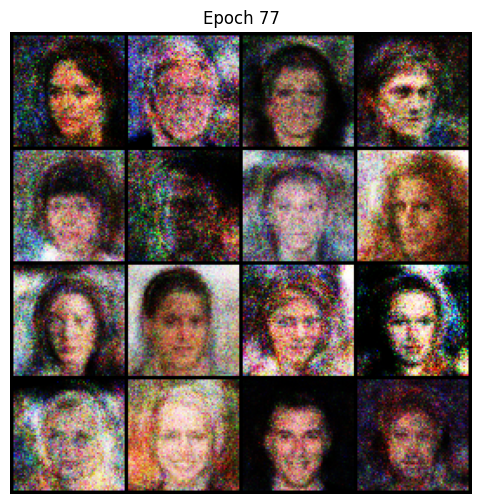

[Epochs 78/100] [Batch 0/1583] [D_loss : 0.34792017936706543] [G_loss : 2.740349769592285]
[Epochs 78/100] [Batch 100/1583] [D_loss : 0.29512864351272583] [G_loss : 3.2832422256469727]
[Epochs 78/100] [Batch 200/1583] [D_loss : 0.3316301703453064] [G_loss : 2.1845943927764893]
[Epochs 78/100] [Batch 300/1583] [D_loss : 0.2791281044483185] [G_loss : 2.591813087463379]
[Epochs 78/100] [Batch 400/1583] [D_loss : 0.3180389702320099] [G_loss : 2.042459487915039]
[Epochs 78/100] [Batch 500/1583] [D_loss : 0.3212379515171051] [G_loss : 2.0238542556762695]
[Epochs 78/100] [Batch 600/1583] [D_loss : 0.2889377474784851] [G_loss : 2.3486132621765137]
[Epochs 78/100] [Batch 700/1583] [D_loss : 0.3345052897930145] [G_loss : 2.2796292304992676]
[Epochs 78/100] [Batch 800/1583] [D_loss : 0.29684022068977356] [G_loss : 3.197070598602295]
[Epochs 78/100] [Batch 900/1583] [D_loss : 0.32035160064697266] [G_loss : 2.892436981201172]
[Epochs 78/100] [Batch 1000/1583] [D_loss : 0.3742918372154236] [G_loss :

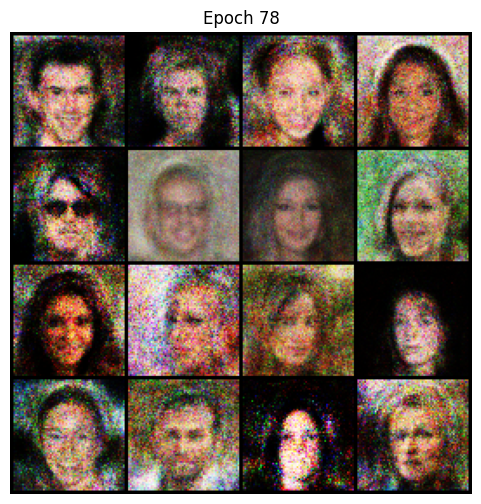

[Epochs 79/100] [Batch 0/1583] [D_loss : 0.32345572113990784] [G_loss : 2.336914539337158]
[Epochs 79/100] [Batch 100/1583] [D_loss : 0.3414933681488037] [G_loss : 2.8204598426818848]
[Epochs 79/100] [Batch 200/1583] [D_loss : 0.24196580052375793] [G_loss : 2.3001954555511475]
[Epochs 79/100] [Batch 300/1583] [D_loss : 0.27202942967414856] [G_loss : 3.007556676864624]
[Epochs 79/100] [Batch 400/1583] [D_loss : 0.24107307195663452] [G_loss : 2.979313373565674]
[Epochs 79/100] [Batch 500/1583] [D_loss : 0.29111555218696594] [G_loss : 2.9592857360839844]
[Epochs 79/100] [Batch 600/1583] [D_loss : 0.2665340304374695] [G_loss : 2.8504557609558105]
[Epochs 79/100] [Batch 700/1583] [D_loss : 0.3949897885322571] [G_loss : 3.340625762939453]
[Epochs 79/100] [Batch 800/1583] [D_loss : 0.25460830330848694] [G_loss : 2.6357381343841553]
[Epochs 79/100] [Batch 900/1583] [D_loss : 0.2694332003593445] [G_loss : 3.0243024826049805]
[Epochs 79/100] [Batch 1000/1583] [D_loss : 0.6278835535049438] [G_los

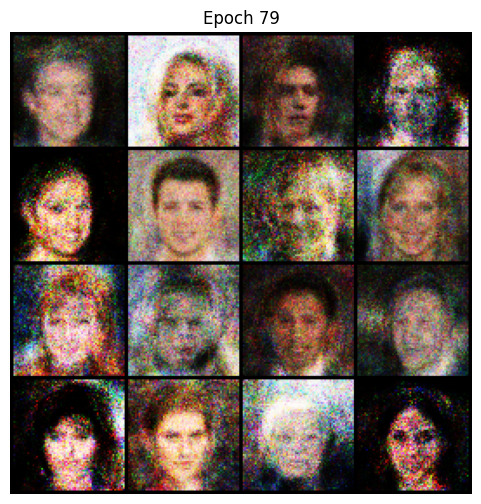

[Epochs 80/100] [Batch 0/1583] [D_loss : 0.2627671957015991] [G_loss : 3.042046546936035]
[Epochs 80/100] [Batch 100/1583] [D_loss : 0.2787299156188965] [G_loss : 2.641465187072754]
[Epochs 80/100] [Batch 200/1583] [D_loss : 0.26220086216926575] [G_loss : 2.4864182472229004]
[Epochs 80/100] [Batch 300/1583] [D_loss : 0.412202924489975] [G_loss : 2.7057032585144043]
[Epochs 80/100] [Batch 400/1583] [D_loss : 0.23124444484710693] [G_loss : 2.956841468811035]
[Epochs 80/100] [Batch 500/1583] [D_loss : 0.22155368328094482] [G_loss : 2.814297676086426]
[Epochs 80/100] [Batch 600/1583] [D_loss : 0.3142421841621399] [G_loss : 2.505358934402466]
[Epochs 80/100] [Batch 700/1583] [D_loss : 0.2143368273973465] [G_loss : 2.302258253097534]
[Epochs 80/100] [Batch 800/1583] [D_loss : 0.2594324052333832] [G_loss : 2.401702404022217]
[Epochs 80/100] [Batch 900/1583] [D_loss : 0.2958991527557373] [G_loss : 2.5744786262512207]
[Epochs 80/100] [Batch 1000/1583] [D_loss : 0.35445016622543335] [G_loss : 2.

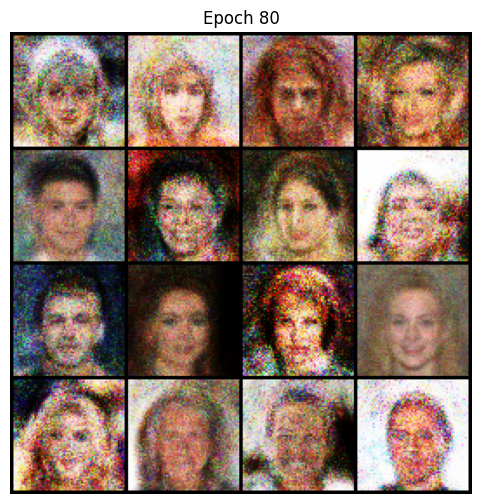

[Epochs 81/100] [Batch 0/1583] [D_loss : 0.5841625928878784] [G_loss : 3.3831467628479004]
[Epochs 81/100] [Batch 100/1583] [D_loss : 0.3306962847709656] [G_loss : 2.3842666149139404]
[Epochs 81/100] [Batch 200/1583] [D_loss : 0.3102256953716278] [G_loss : 2.2963924407958984]
[Epochs 81/100] [Batch 300/1583] [D_loss : 0.3131662607192993] [G_loss : 4.025094985961914]
[Epochs 81/100] [Batch 400/1583] [D_loss : 0.2881079316139221] [G_loss : 2.7670485973358154]
[Epochs 81/100] [Batch 500/1583] [D_loss : 0.26799699664115906] [G_loss : 2.379244327545166]
[Epochs 81/100] [Batch 600/1583] [D_loss : 0.35005950927734375] [G_loss : 1.9908324480056763]
[Epochs 81/100] [Batch 700/1583] [D_loss : 0.25557461380958557] [G_loss : 2.6669697761535645]
[Epochs 81/100] [Batch 800/1583] [D_loss : 0.32277971506118774] [G_loss : 1.8891273736953735]
[Epochs 81/100] [Batch 900/1583] [D_loss : 0.23720121383666992] [G_loss : 2.540480136871338]
[Epochs 81/100] [Batch 1000/1583] [D_loss : 0.2681530714035034] [G_los

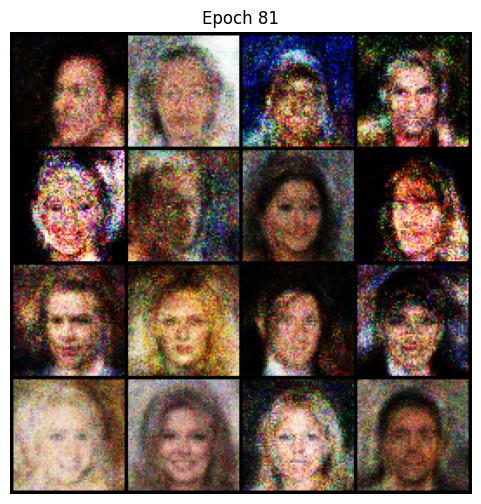

[Epochs 82/100] [Batch 0/1583] [D_loss : 0.3144613802433014] [G_loss : 2.548799991607666]
[Epochs 82/100] [Batch 100/1583] [D_loss : 0.2599634826183319] [G_loss : 2.5792770385742188]
[Epochs 82/100] [Batch 200/1583] [D_loss : 0.23538759350776672] [G_loss : 3.208780288696289]
[Epochs 82/100] [Batch 300/1583] [D_loss : 0.2469024658203125] [G_loss : 2.536207437515259]
[Epochs 82/100] [Batch 400/1583] [D_loss : 0.21763752400875092] [G_loss : 2.9678032398223877]
[Epochs 82/100] [Batch 500/1583] [D_loss : 0.35319799184799194] [G_loss : 2.2634220123291016]
[Epochs 82/100] [Batch 600/1583] [D_loss : 0.43775954842567444] [G_loss : 2.615933895111084]
[Epochs 82/100] [Batch 700/1583] [D_loss : 0.28323298692703247] [G_loss : 2.002200126647949]
[Epochs 82/100] [Batch 800/1583] [D_loss : 0.2898966073989868] [G_loss : 2.5027527809143066]
[Epochs 82/100] [Batch 900/1583] [D_loss : 0.2606784701347351] [G_loss : 2.074486017227173]
[Epochs 82/100] [Batch 1000/1583] [D_loss : 0.3540825843811035] [G_loss :

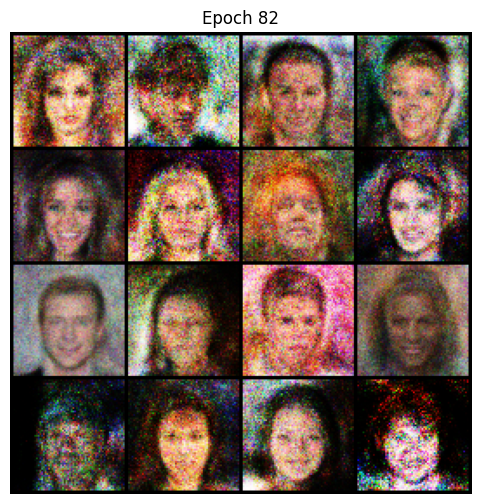

[Epochs 83/100] [Batch 0/1583] [D_loss : 0.6801953315734863] [G_loss : 3.694920063018799]
[Epochs 83/100] [Batch 100/1583] [D_loss : 0.28690075874328613] [G_loss : 2.8278398513793945]
[Epochs 83/100] [Batch 200/1583] [D_loss : 0.251690536737442] [G_loss : 2.847630262374878]
[Epochs 83/100] [Batch 300/1583] [D_loss : 0.23381859064102173] [G_loss : 2.371999502182007]
[Epochs 83/100] [Batch 400/1583] [D_loss : 0.36836645007133484] [G_loss : 1.5084562301635742]
[Epochs 83/100] [Batch 500/1583] [D_loss : 0.26645368337631226] [G_loss : 2.689206600189209]
[Epochs 83/100] [Batch 600/1583] [D_loss : 0.23444336652755737] [G_loss : 3.1918835639953613]
[Epochs 83/100] [Batch 700/1583] [D_loss : 0.34894320368766785] [G_loss : 2.4380722045898438]
[Epochs 83/100] [Batch 800/1583] [D_loss : 0.25573045015335083] [G_loss : 2.9647367000579834]
[Epochs 83/100] [Batch 900/1583] [D_loss : 0.32901912927627563] [G_loss : 2.902458429336548]
[Epochs 83/100] [Batch 1000/1583] [D_loss : 0.2719438076019287] [G_los

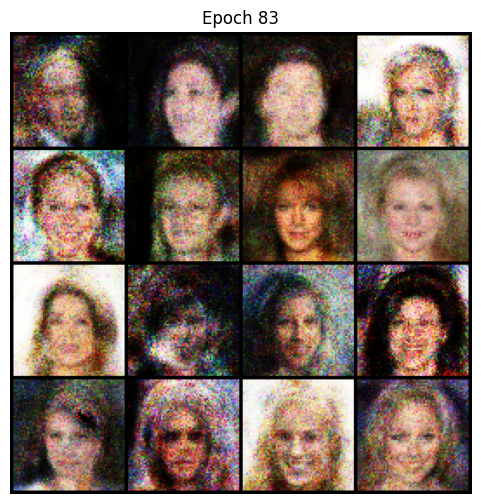

[Epochs 84/100] [Batch 0/1583] [D_loss : 0.24006414413452148] [G_loss : 2.1561808586120605]
[Epochs 84/100] [Batch 100/1583] [D_loss : 0.29149433970451355] [G_loss : 2.81676983833313]
[Epochs 84/100] [Batch 200/1583] [D_loss : 0.23184508085250854] [G_loss : 2.1486597061157227]
[Epochs 84/100] [Batch 300/1583] [D_loss : 0.2974920868873596] [G_loss : 3.3856616020202637]
[Epochs 84/100] [Batch 400/1583] [D_loss : 0.284651517868042] [G_loss : 2.7616286277770996]
[Epochs 84/100] [Batch 500/1583] [D_loss : 0.36434996128082275] [G_loss : 2.8684728145599365]
[Epochs 84/100] [Batch 600/1583] [D_loss : 0.2830522060394287] [G_loss : 3.017826795578003]
[Epochs 84/100] [Batch 700/1583] [D_loss : 0.25136736035346985] [G_loss : 2.3214704990386963]
[Epochs 84/100] [Batch 800/1583] [D_loss : 0.2762380838394165] [G_loss : 2.618997097015381]
[Epochs 84/100] [Batch 900/1583] [D_loss : 0.273791640996933] [G_loss : 2.446925163269043]
[Epochs 84/100] [Batch 1000/1583] [D_loss : 0.2665037512779236] [G_loss : 

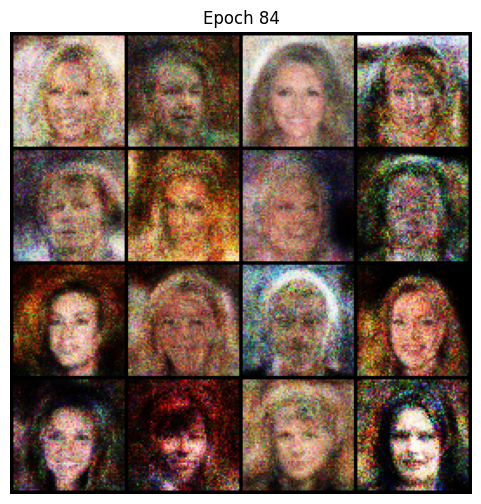

[Epochs 85/100] [Batch 0/1583] [D_loss : 0.3042251467704773] [G_loss : 2.799041271209717]
[Epochs 85/100] [Batch 100/1583] [D_loss : 0.20348778367042542] [G_loss : 3.0492634773254395]
[Epochs 85/100] [Batch 200/1583] [D_loss : 0.48844605684280396] [G_loss : 1.4130640029907227]
[Epochs 85/100] [Batch 300/1583] [D_loss : 0.23584039509296417] [G_loss : 3.1444473266601562]
[Epochs 85/100] [Batch 400/1583] [D_loss : 0.27757686376571655] [G_loss : 2.52847957611084]
[Epochs 85/100] [Batch 500/1583] [D_loss : 0.26465287804603577] [G_loss : 2.299990653991699]
[Epochs 85/100] [Batch 600/1583] [D_loss : 0.2699972987174988] [G_loss : 2.8440561294555664]
[Epochs 85/100] [Batch 700/1583] [D_loss : 0.2619137763977051] [G_loss : 2.678421974182129]
[Epochs 85/100] [Batch 800/1583] [D_loss : 0.22041332721710205] [G_loss : 3.0998716354370117]
[Epochs 85/100] [Batch 900/1583] [D_loss : 0.29204607009887695] [G_loss : 2.690066337585449]
[Epochs 85/100] [Batch 1000/1583] [D_loss : 0.29074710607528687] [G_los

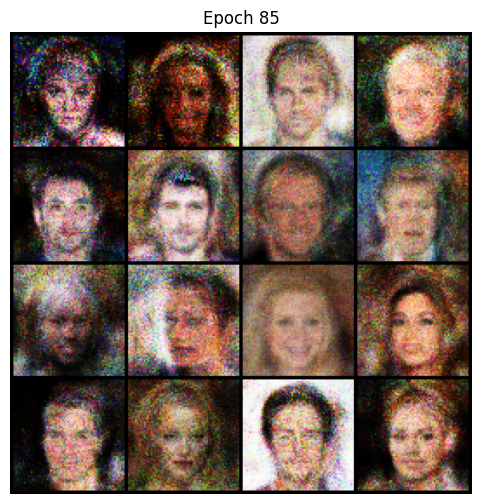

[Epochs 86/100] [Batch 0/1583] [D_loss : 0.2316935509443283] [G_loss : 2.7664222717285156]
[Epochs 86/100] [Batch 100/1583] [D_loss : 0.29514211416244507] [G_loss : 3.3770055770874023]
[Epochs 86/100] [Batch 200/1583] [D_loss : 0.20815429091453552] [G_loss : 2.933077335357666]
[Epochs 86/100] [Batch 300/1583] [D_loss : 0.3618139922618866] [G_loss : 3.058698892593384]
[Epochs 86/100] [Batch 400/1583] [D_loss : 0.398007869720459] [G_loss : 3.3516461849212646]
[Epochs 86/100] [Batch 500/1583] [D_loss : 0.28560686111450195] [G_loss : 2.550384521484375]
[Epochs 86/100] [Batch 600/1583] [D_loss : 0.20697945356369019] [G_loss : 2.6722776889801025]
[Epochs 86/100] [Batch 700/1583] [D_loss : 0.25619351863861084] [G_loss : 2.6775834560394287]
[Epochs 86/100] [Batch 800/1583] [D_loss : 0.2832140326499939] [G_loss : 3.211639881134033]
[Epochs 86/100] [Batch 900/1583] [D_loss : 0.20309999585151672] [G_loss : 3.1033477783203125]
[Epochs 86/100] [Batch 1000/1583] [D_loss : 0.29683688282966614] [G_los

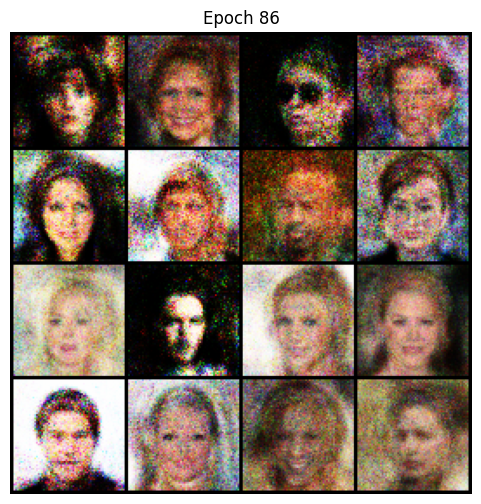

[Epochs 87/100] [Batch 0/1583] [D_loss : 0.2611517012119293] [G_loss : 2.5812296867370605]
[Epochs 87/100] [Batch 100/1583] [D_loss : 0.18250472843647003] [G_loss : 3.9057860374450684]
[Epochs 87/100] [Batch 200/1583] [D_loss : 0.29664283990859985] [G_loss : 3.7148494720458984]
[Epochs 87/100] [Batch 300/1583] [D_loss : 0.2694794237613678] [G_loss : 2.265488624572754]
[Epochs 87/100] [Batch 400/1583] [D_loss : 0.23587468266487122] [G_loss : 3.155486583709717]
[Epochs 87/100] [Batch 500/1583] [D_loss : 0.1838494837284088] [G_loss : 3.5640406608581543]
[Epochs 87/100] [Batch 600/1583] [D_loss : 0.263627827167511] [G_loss : 2.371098041534424]
[Epochs 87/100] [Batch 700/1583] [D_loss : 0.21174761652946472] [G_loss : 2.5183277130126953]
[Epochs 87/100] [Batch 800/1583] [D_loss : 0.15560664236545563] [G_loss : 3.617839813232422]
[Epochs 87/100] [Batch 900/1583] [D_loss : 0.24170701205730438] [G_loss : 2.3729300498962402]
[Epochs 87/100] [Batch 1000/1583] [D_loss : 0.2752159535884857] [G_loss

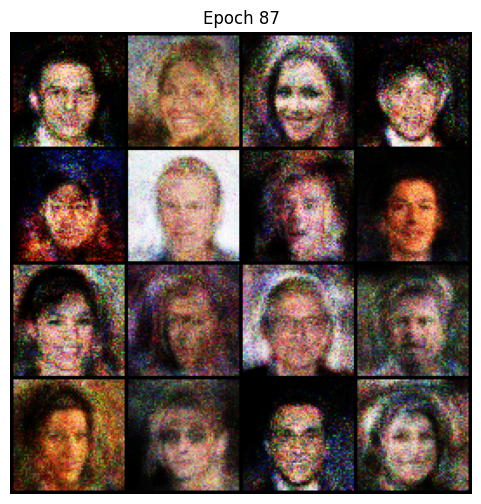

[Epochs 88/100] [Batch 0/1583] [D_loss : 0.29484638571739197] [G_loss : 3.41172194480896]
[Epochs 88/100] [Batch 100/1583] [D_loss : 0.23191893100738525] [G_loss : 3.298773765563965]
[Epochs 88/100] [Batch 200/1583] [D_loss : 0.2540791630744934] [G_loss : 2.916438579559326]
[Epochs 88/100] [Batch 300/1583] [D_loss : 0.2630005478858948] [G_loss : 1.471679449081421]
[Epochs 88/100] [Batch 400/1583] [D_loss : 0.26936066150665283] [G_loss : 2.693169116973877]
[Epochs 88/100] [Batch 500/1583] [D_loss : 0.19204045832157135] [G_loss : 3.2947804927825928]
[Epochs 88/100] [Batch 600/1583] [D_loss : 0.34493008255958557] [G_loss : 2.6427807807922363]
[Epochs 88/100] [Batch 700/1583] [D_loss : 0.25438934564590454] [G_loss : 3.701655864715576]
[Epochs 88/100] [Batch 800/1583] [D_loss : 0.27171218395233154] [G_loss : 2.434556245803833]
[Epochs 88/100] [Batch 900/1583] [D_loss : 0.24140477180480957] [G_loss : 2.4408726692199707]
[Epochs 88/100] [Batch 1000/1583] [D_loss : 0.29523181915283203] [G_loss

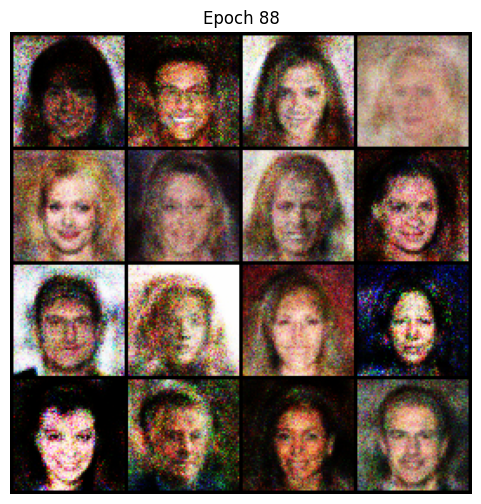

[Epochs 89/100] [Batch 0/1583] [D_loss : 0.21545936167240143] [G_loss : 2.807213068008423]
[Epochs 89/100] [Batch 100/1583] [D_loss : 0.30122435092926025] [G_loss : 2.2927193641662598]
[Epochs 89/100] [Batch 200/1583] [D_loss : 0.2540490925312042] [G_loss : 2.959963798522949]
[Epochs 89/100] [Batch 300/1583] [D_loss : 0.28826555609703064] [G_loss : 3.013848066329956]
[Epochs 89/100] [Batch 400/1583] [D_loss : 0.21780236065387726] [G_loss : 3.2421772480010986]
[Epochs 89/100] [Batch 500/1583] [D_loss : 0.23612411320209503] [G_loss : 2.7058141231536865]
[Epochs 89/100] [Batch 600/1583] [D_loss : 0.20301607251167297] [G_loss : 2.696601152420044]
[Epochs 89/100] [Batch 700/1583] [D_loss : 0.24579961597919464] [G_loss : 2.780066967010498]
[Epochs 89/100] [Batch 800/1583] [D_loss : 0.2703082859516144] [G_loss : 3.699761390686035]
[Epochs 89/100] [Batch 900/1583] [D_loss : 0.2346295416355133] [G_loss : 3.4294543266296387]
[Epochs 89/100] [Batch 1000/1583] [D_loss : 0.25339505076408386] [G_los

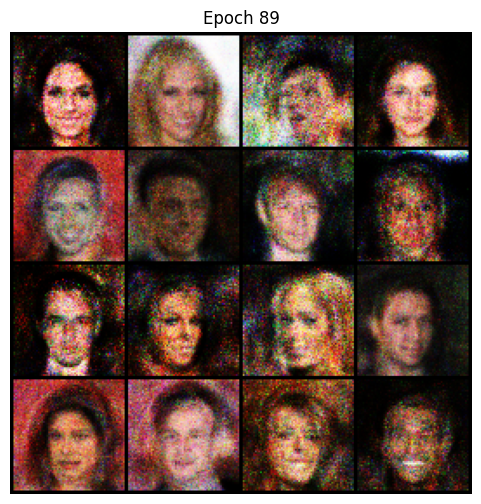

[Epochs 90/100] [Batch 0/1583] [D_loss : 0.20502200722694397] [G_loss : 2.569591522216797]
[Epochs 90/100] [Batch 100/1583] [D_loss : 0.23622703552246094] [G_loss : 1.8213355541229248]
[Epochs 90/100] [Batch 200/1583] [D_loss : 0.2090234011411667] [G_loss : 3.4551658630371094]
[Epochs 90/100] [Batch 300/1583] [D_loss : 0.22175201773643494] [G_loss : 2.620910406112671]
[Epochs 90/100] [Batch 400/1583] [D_loss : 0.26494476199150085] [G_loss : 2.5891826152801514]
[Epochs 90/100] [Batch 500/1583] [D_loss : 0.22377575933933258] [G_loss : 3.1376919746398926]
[Epochs 90/100] [Batch 600/1583] [D_loss : 0.2574321925640106] [G_loss : 2.5504422187805176]
[Epochs 90/100] [Batch 700/1583] [D_loss : 0.25483614206314087] [G_loss : 3.0294413566589355]
[Epochs 90/100] [Batch 800/1583] [D_loss : 0.25390562415122986] [G_loss : 3.0000438690185547]
[Epochs 90/100] [Batch 900/1583] [D_loss : 0.2151520550251007] [G_loss : 3.5335123538970947]
[Epochs 90/100] [Batch 1000/1583] [D_loss : 0.22178399562835693] [G

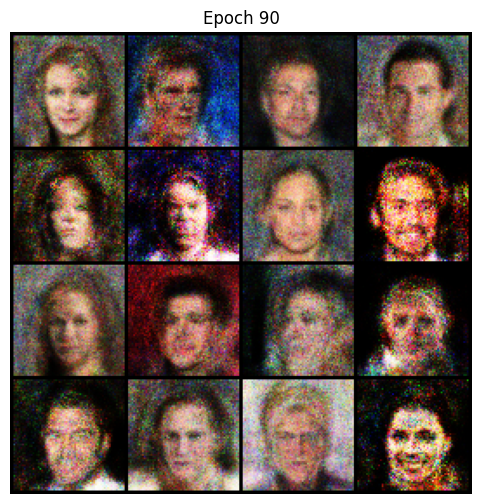

[Epochs 91/100] [Batch 0/1583] [D_loss : 0.27447617053985596] [G_loss : 2.518730878829956]
[Epochs 91/100] [Batch 100/1583] [D_loss : 0.3157433271408081] [G_loss : 3.193485975265503]
[Epochs 91/100] [Batch 200/1583] [D_loss : 0.20204783976078033] [G_loss : 3.0962934494018555]
[Epochs 91/100] [Batch 300/1583] [D_loss : 0.24270035326480865] [G_loss : 2.5679233074188232]
[Epochs 91/100] [Batch 400/1583] [D_loss : 0.29125216603279114] [G_loss : 3.2294678688049316]
[Epochs 91/100] [Batch 500/1583] [D_loss : 0.19816240668296814] [G_loss : 2.8075509071350098]
[Epochs 91/100] [Batch 600/1583] [D_loss : 0.36750853061676025] [G_loss : 2.5631799697875977]
[Epochs 91/100] [Batch 700/1583] [D_loss : 0.21052610874176025] [G_loss : 2.904910087585449]
[Epochs 91/100] [Batch 800/1583] [D_loss : 0.3071991205215454] [G_loss : 3.6268692016601562]
[Epochs 91/100] [Batch 900/1583] [D_loss : 0.23376433551311493] [G_loss : 3.630394220352173]
[Epochs 91/100] [Batch 1000/1583] [D_loss : 0.2266055941581726] [G_l

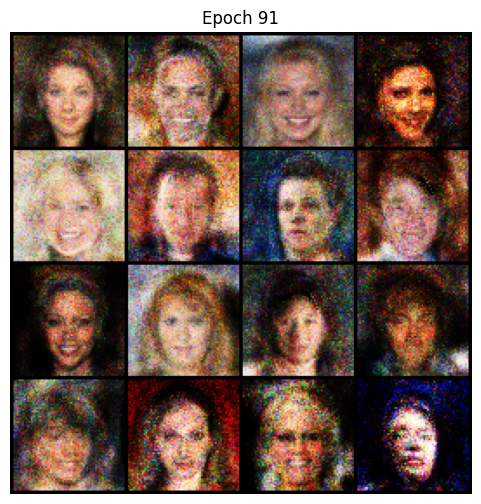

[Epochs 92/100] [Batch 0/1583] [D_loss : 0.28578951954841614] [G_loss : 2.5851528644561768]
[Epochs 92/100] [Batch 100/1583] [D_loss : 0.32353463768959045] [G_loss : 3.1781532764434814]
[Epochs 92/100] [Batch 200/1583] [D_loss : 0.24126577377319336] [G_loss : 3.582993507385254]
[Epochs 92/100] [Batch 300/1583] [D_loss : 0.22141560912132263] [G_loss : 2.736703872680664]
[Epochs 92/100] [Batch 400/1583] [D_loss : 0.25583675503730774] [G_loss : 2.727306365966797]
[Epochs 92/100] [Batch 500/1583] [D_loss : 0.3912163972854614] [G_loss : 2.4892578125]
[Epochs 92/100] [Batch 600/1583] [D_loss : 0.19404849410057068] [G_loss : 3.5230464935302734]
[Epochs 92/100] [Batch 700/1583] [D_loss : 0.20201116800308228] [G_loss : 2.5808486938476562]
[Epochs 92/100] [Batch 800/1583] [D_loss : 0.24293501675128937] [G_loss : 3.932131767272949]
[Epochs 92/100] [Batch 900/1583] [D_loss : 0.35043710470199585] [G_loss : 3.7196998596191406]
[Epochs 92/100] [Batch 1000/1583] [D_loss : 0.3063068091869354] [G_loss :

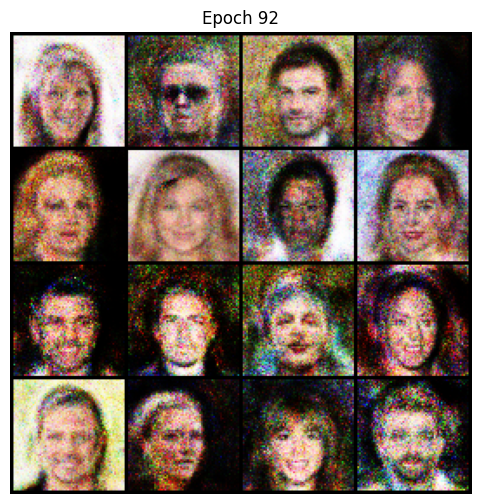

[Epochs 93/100] [Batch 0/1583] [D_loss : 0.2729066014289856] [G_loss : 3.873028516769409]
[Epochs 93/100] [Batch 100/1583] [D_loss : 0.20729494094848633] [G_loss : 3.2214391231536865]
[Epochs 93/100] [Batch 200/1583] [D_loss : 0.1674172729253769] [G_loss : 2.786276340484619]
[Epochs 93/100] [Batch 300/1583] [D_loss : 0.37262439727783203] [G_loss : 2.9962916374206543]
[Epochs 93/100] [Batch 400/1583] [D_loss : 0.21469181776046753] [G_loss : 2.888411521911621]
[Epochs 93/100] [Batch 500/1583] [D_loss : 0.21045348048210144] [G_loss : 3.630401134490967]
[Epochs 93/100] [Batch 600/1583] [D_loss : 0.28479284048080444] [G_loss : 2.9786336421966553]
[Epochs 93/100] [Batch 700/1583] [D_loss : 0.24494776129722595] [G_loss : 3.4460701942443848]
[Epochs 93/100] [Batch 800/1583] [D_loss : 0.1780637800693512] [G_loss : 2.4012393951416016]
[Epochs 93/100] [Batch 900/1583] [D_loss : 0.2474386990070343] [G_loss : 2.7935476303100586]
[Epochs 93/100] [Batch 1000/1583] [D_loss : 0.2892323136329651] [G_los

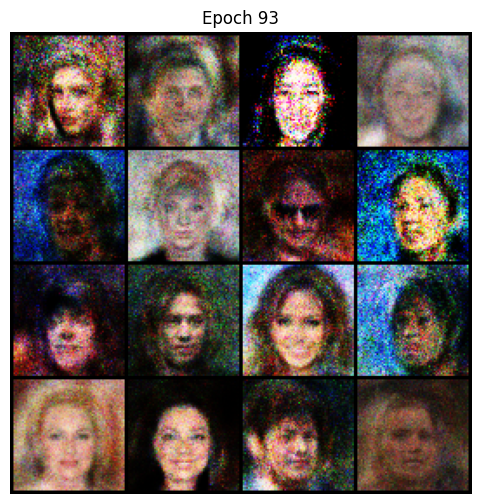

[Epochs 94/100] [Batch 0/1583] [D_loss : 0.2171708345413208] [G_loss : 3.0642189979553223]
[Epochs 94/100] [Batch 100/1583] [D_loss : 0.2382110208272934] [G_loss : 3.5339391231536865]
[Epochs 94/100] [Batch 200/1583] [D_loss : 0.2616349756717682] [G_loss : 3.004277229309082]
[Epochs 94/100] [Batch 300/1583] [D_loss : 0.2238534390926361] [G_loss : 2.350057601928711]
[Epochs 94/100] [Batch 400/1583] [D_loss : 0.22441968321800232] [G_loss : 3.385484218597412]
[Epochs 94/100] [Batch 500/1583] [D_loss : 0.22484707832336426] [G_loss : 2.903939723968506]
[Epochs 94/100] [Batch 600/1583] [D_loss : 0.253207802772522] [G_loss : 2.0834097862243652]
[Epochs 94/100] [Batch 700/1583] [D_loss : 0.2531006336212158] [G_loss : 2.5786023139953613]
[Epochs 94/100] [Batch 800/1583] [D_loss : 0.32154983282089233] [G_loss : 2.5441970825195312]
[Epochs 94/100] [Batch 900/1583] [D_loss : 0.1697685420513153] [G_loss : 3.4972712993621826]
[Epochs 94/100] [Batch 1000/1583] [D_loss : 0.23994037508964539] [G_loss :

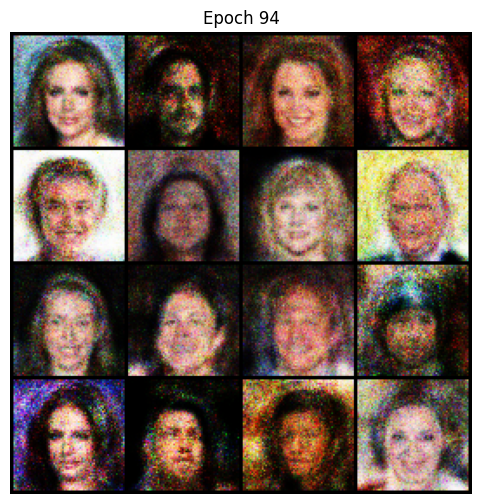

[Epochs 95/100] [Batch 0/1583] [D_loss : 0.20314717292785645] [G_loss : 3.188084363937378]
[Epochs 95/100] [Batch 100/1583] [D_loss : 0.2341211438179016] [G_loss : 3.650117874145508]
[Epochs 95/100] [Batch 200/1583] [D_loss : 0.14880087971687317] [G_loss : 3.5159497261047363]
[Epochs 95/100] [Batch 300/1583] [D_loss : 0.19783887267112732] [G_loss : 2.9096689224243164]
[Epochs 95/100] [Batch 400/1583] [D_loss : 0.21004199981689453] [G_loss : 3.20202374458313]
[Epochs 95/100] [Batch 500/1583] [D_loss : 0.2242073118686676] [G_loss : 2.3340187072753906]
[Epochs 95/100] [Batch 600/1583] [D_loss : 0.33239883184432983] [G_loss : 3.278013229370117]
[Epochs 95/100] [Batch 700/1583] [D_loss : 0.2709120810031891] [G_loss : 3.7566676139831543]
[Epochs 95/100] [Batch 800/1583] [D_loss : 0.17094293236732483] [G_loss : 4.26729154586792]
[Epochs 95/100] [Batch 900/1583] [D_loss : 0.349688321352005] [G_loss : 2.565483808517456]
[Epochs 95/100] [Batch 1000/1583] [D_loss : 0.24133479595184326] [G_loss : 

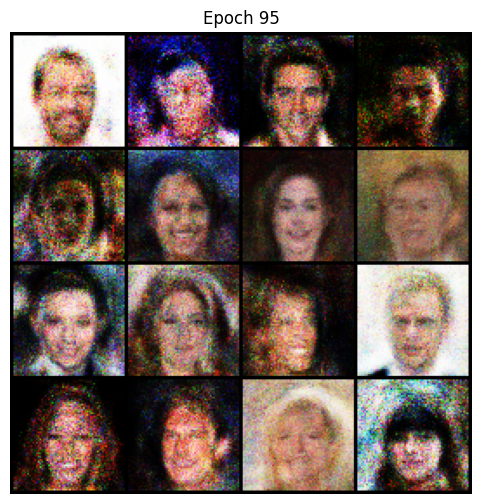

[Epochs 96/100] [Batch 0/1583] [D_loss : 0.24318575859069824] [G_loss : 2.552002191543579]
[Epochs 96/100] [Batch 100/1583] [D_loss : 0.25812917947769165] [G_loss : 4.019561767578125]
[Epochs 96/100] [Batch 200/1583] [D_loss : 0.23465029895305634] [G_loss : 2.1643550395965576]
[Epochs 96/100] [Batch 300/1583] [D_loss : 0.3017238676548004] [G_loss : 2.3835201263427734]
[Epochs 96/100] [Batch 400/1583] [D_loss : 0.23521383106708527] [G_loss : 3.053630828857422]
[Epochs 96/100] [Batch 500/1583] [D_loss : 0.23490455746650696] [G_loss : 2.4728689193725586]
[Epochs 96/100] [Batch 600/1583] [D_loss : 0.32016387581825256] [G_loss : 3.302114486694336]
[Epochs 96/100] [Batch 700/1583] [D_loss : 0.2932186424732208] [G_loss : 2.635589122772217]
[Epochs 96/100] [Batch 800/1583] [D_loss : 0.25425076484680176] [G_loss : 2.408700466156006]
[Epochs 96/100] [Batch 900/1583] [D_loss : 0.25680890679359436] [G_loss : 2.850739002227783]
[Epochs 96/100] [Batch 1000/1583] [D_loss : 0.2137470245361328] [G_loss

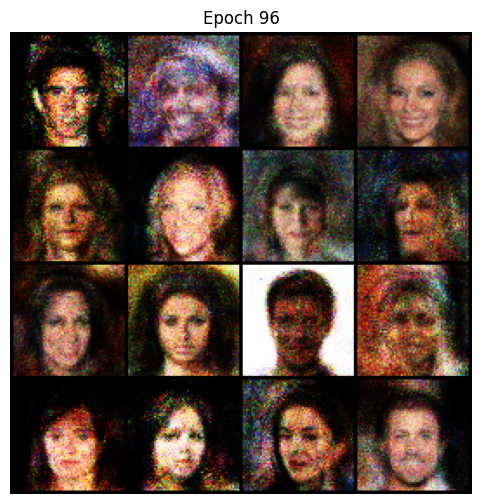

[Epochs 97/100] [Batch 0/1583] [D_loss : 0.19586673378944397] [G_loss : 2.8362059593200684]
[Epochs 97/100] [Batch 100/1583] [D_loss : 0.23094262182712555] [G_loss : 3.0902609825134277]
[Epochs 97/100] [Batch 200/1583] [D_loss : 0.28372466564178467] [G_loss : 2.6643476486206055]
[Epochs 97/100] [Batch 300/1583] [D_loss : 0.19268405437469482] [G_loss : 3.430912494659424]
[Epochs 97/100] [Batch 400/1583] [D_loss : 0.22396090626716614] [G_loss : 3.8547492027282715]
[Epochs 97/100] [Batch 500/1583] [D_loss : 0.18587839603424072] [G_loss : 3.3840436935424805]
[Epochs 97/100] [Batch 600/1583] [D_loss : 0.2192346751689911] [G_loss : 2.9975459575653076]
[Epochs 97/100] [Batch 700/1583] [D_loss : 0.20403727889060974] [G_loss : 3.6936264038085938]
[Epochs 97/100] [Batch 800/1583] [D_loss : 0.2731170654296875] [G_loss : 3.255051851272583]
[Epochs 97/100] [Batch 900/1583] [D_loss : 0.2279672622680664] [G_loss : 2.4582977294921875]
[Epochs 97/100] [Batch 1000/1583] [D_loss : 0.3198791742324829] [G_

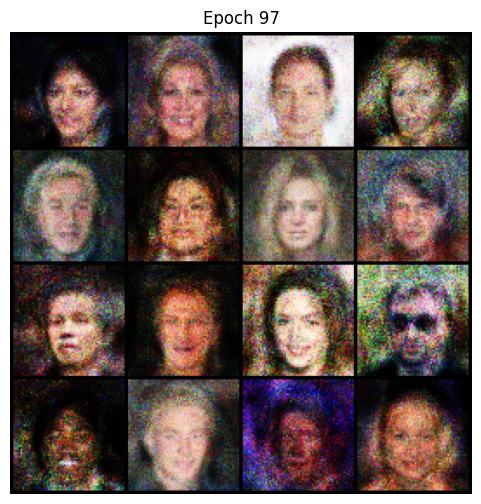

[Epochs 98/100] [Batch 0/1583] [D_loss : 0.20004449784755707] [G_loss : 3.5575194358825684]
[Epochs 98/100] [Batch 100/1583] [D_loss : 0.20551952719688416] [G_loss : 2.9611997604370117]
[Epochs 98/100] [Batch 200/1583] [D_loss : 0.30742526054382324] [G_loss : 2.125551223754883]
[Epochs 98/100] [Batch 300/1583] [D_loss : 0.2327563315629959] [G_loss : 3.626250743865967]
[Epochs 98/100] [Batch 400/1583] [D_loss : 0.200754776597023] [G_loss : 2.740617275238037]
[Epochs 98/100] [Batch 500/1583] [D_loss : 0.18161076307296753] [G_loss : 3.099994659423828]
[Epochs 98/100] [Batch 600/1583] [D_loss : 0.25847211480140686] [G_loss : 2.5775113105773926]
[Epochs 98/100] [Batch 700/1583] [D_loss : 0.2065087854862213] [G_loss : 2.3499298095703125]
[Epochs 98/100] [Batch 800/1583] [D_loss : 0.2058791220188141] [G_loss : 2.59085750579834]
[Epochs 98/100] [Batch 900/1583] [D_loss : 0.33100077509880066] [G_loss : 3.577866554260254]
[Epochs 98/100] [Batch 1000/1583] [D_loss : 0.2799956202507019] [G_loss : 

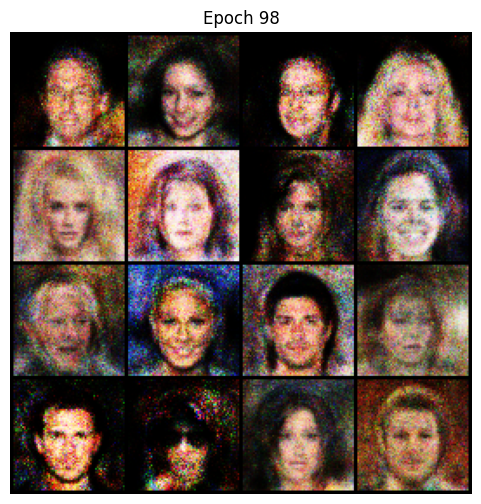

[Epochs 99/100] [Batch 0/1583] [D_loss : 0.2549228072166443] [G_loss : 2.617859363555908]
[Epochs 99/100] [Batch 100/1583] [D_loss : 0.36216771602630615] [G_loss : 2.2190022468566895]
[Epochs 99/100] [Batch 200/1583] [D_loss : 0.3068915009498596] [G_loss : 3.344679832458496]
[Epochs 99/100] [Batch 300/1583] [D_loss : 0.20815256237983704] [G_loss : 3.2814764976501465]
[Epochs 99/100] [Batch 400/1583] [D_loss : 0.21866582334041595] [G_loss : 3.593660831451416]
[Epochs 99/100] [Batch 500/1583] [D_loss : 0.2441364824771881] [G_loss : 4.033536911010742]
[Epochs 99/100] [Batch 600/1583] [D_loss : 0.22837895154953003] [G_loss : 2.515287399291992]
[Epochs 99/100] [Batch 700/1583] [D_loss : 0.2091047167778015] [G_loss : 2.783945083618164]
[Epochs 99/100] [Batch 800/1583] [D_loss : 0.21052516996860504] [G_loss : 3.396604537963867]
[Epochs 99/100] [Batch 900/1583] [D_loss : 0.1762828528881073] [G_loss : 2.796748638153076]
[Epochs 99/100] [Batch 1000/1583] [D_loss : 0.189154714345932] [G_loss : 3.

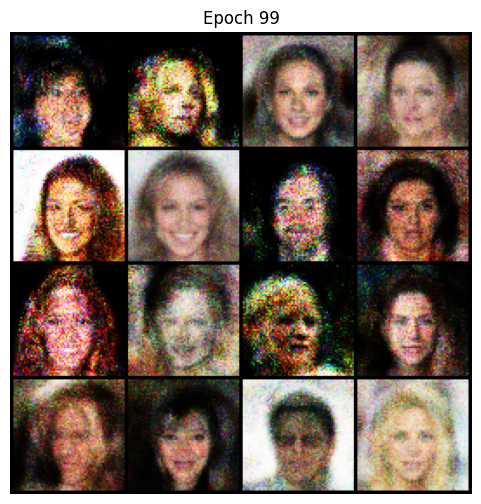

[Epochs 100/100] [Batch 0/1583] [D_loss : 0.21702833473682404] [G_loss : 3.1421091556549072]
[Epochs 100/100] [Batch 100/1583] [D_loss : 0.21251627802848816] [G_loss : 3.531043767929077]
[Epochs 100/100] [Batch 200/1583] [D_loss : 0.16620579361915588] [G_loss : 3.3165640830993652]
[Epochs 100/100] [Batch 300/1583] [D_loss : 0.19456526637077332] [G_loss : 3.461169719696045]
[Epochs 100/100] [Batch 400/1583] [D_loss : 0.2809531092643738] [G_loss : 2.965121030807495]
[Epochs 100/100] [Batch 500/1583] [D_loss : 0.2567303478717804] [G_loss : 3.250715970993042]
[Epochs 100/100] [Batch 600/1583] [D_loss : 0.17230060696601868] [G_loss : 3.361515998840332]
[Epochs 100/100] [Batch 700/1583] [D_loss : 0.1844315379858017] [G_loss : 3.4402217864990234]
[Epochs 100/100] [Batch 800/1583] [D_loss : 0.1871357560157776] [G_loss : 3.3387327194213867]
[Epochs 100/100] [Batch 900/1583] [D_loss : 0.22880825400352478] [G_loss : 2.9536609649658203]
[Epochs 100/100] [Batch 1000/1583] [D_loss : 0.25399976968765

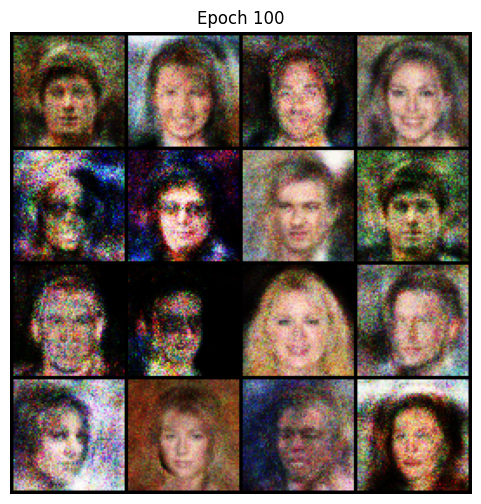

In [25]:
# Start training
train(generator, discriminator, dataloader, epochs=100)